In [1]:
@show VERSION
@time using DifferentialEquations
@time using Plots
@time using ProgressMeter
@time using Parameters

VERSION = v"1.7.0-DEV.1249"
 20.717963 seconds (25.32 M allocations: 1.791 GiB, 2.75% gc time)
  7.452482 seconds (9.21 M allocations: 654.402 MiB, 5.26% gc time, 1.85% compilation time)
  0.098692 seconds (8.99 k allocations: 552.594 KiB)
  0.001692 seconds (277 allocations: 19.859 KiB)


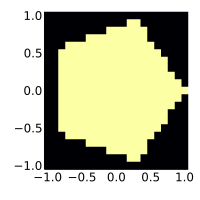

In [2]:
x ⪅ y = x < y || x ≈ y

function isin_ngon(n, R, x, y)
    α = 2π/n
    θ = mod(angle(x + im*y), α)
    r = √(x^2 + y^2) / R
    X, Y = r*cos(θ), r*sin(θ)
    (1 - cos(α))*Y ⪅ sin(α)*(1 - X)
end

isin_unit_pentagon(x, y) = isin_ngon(5, 1, x, y)

x = -1:0.1:1
y = -1:0.1:1
D = isin_unit_pentagon.(x, y')
heatmap(x, y, D'; colorbar=false, size=(200, 200))

In [3]:
module My

using Parameters: @unpack

struct Param{TX, TY, TH, TV, TE, TV_dic}
    x::TX
    y::TY
    h⁻²::TH
    V::TV
    E::TE
    V_dic::TV_dic
end

Base.length(p::Param) = length(p.V)
Base.size(p::Param) = (length(p.x), length(p.y))

mystep(x::AbstractVector) = x[2] - x[1]
mystep(x::StepRangeLen) = step(x)

function Param(isin_func, x::AbstractVector, y::AbstractVector)
    @assert mystep(x) == mystep(y)
    h⁻² = 1/mystep(x)^2
    I, J = eachindex(x), eachindex(y)
    D = isin_func.(x, y')
    V = Tuple{Int64, Int64}[]
    E_mat = [Tuple{Int64, Int64}[] for i in I, j in J]
    B_mat = zeros(Int64, length(I), length(J))
    for j in J, i in I
        if D[i, j]
            push!(V, (i, j))
            for q in (-1, 1), p in (-1, 1)
                if i+p in I && j+q in J && D[i+p, j+q]
                    push!(E_mat[i, j], (i+p, j+q))
                end
            end
        end
    end
    V_dic = Dict(V[k] => k for k in eachindex(V))
    E = [getindex.(Ref(V_dic), E_mat[V[k]...]) for k in eachindex(V)]
    Param(x, y, h⁻², V, E, V_dic)
end

function vec2mat!(p::Param, u, U)
    @unpack V = p
    for k in eachindex(V)
        U[V[k]...] = u[k]
    end
    U
end
    
function vec2mat(p::Param, u; default_value=NaN)
    U = fill(eltype(u)(default_value), size(p))
    vec2mat!(p, u, U)
end

function mat2vec!(p::Param, U, u)
    @unpack V_dic = p
    for t in keys(V_dic)
        u[V_dic[t]] = U[t...]
    end
    u
end

function mat2vec(p::Param, U)
    u = similar(eltype(U)[], length(p))
    mat2vec!(p, U, u)
end

end

x = -1:0.1:1
y = -1:0.1:1
p = My.Param(isin_unit_pentagon, x, y)

@unpack h⁻², V, E = p
@show h⁻²
@show V[50]
@show E[50]
@show V[E[50]]

u0 = collect(1.0:length(V))
U0 = My.vec2mat(p, u0; default_value=0)
@show My.mat2vec(p, U0) == u0
U0'

h⁻² = 99.99999999999999
V[50] = (7, 7)
E[50] = [34, 36, 65, 67]
V[E[50]] = [(6, 6), (8, 6), (6, 8), (8, 8)]
My.mat2vec(p, U0) == u0 = true


21×21 adjoint(::Matrix{Float64}) with eltype Float64:
 0.0  0.0    0.0    0.0    0.0    0.0  …    0.0    0.0    0.0    0.0    0.0
 0.0  0.0    0.0    0.0    0.0    0.0       0.0    0.0    0.0    0.0    0.0
 0.0  0.0    0.0    0.0    0.0    0.0       0.0    0.0    0.0    0.0    0.0
 0.0  0.0    0.0    0.0    0.0    0.0       0.0    0.0    0.0    0.0    0.0
 0.0  0.0    0.0   18.0   19.0   20.0       0.0    0.0    0.0    0.0    0.0
 0.0  0.0   31.0   32.0   33.0   34.0  …   45.0    0.0    0.0    0.0    0.0
 0.0  0.0   46.0   47.0   48.0   49.0      60.0   61.0    0.0    0.0    0.0
 0.0  0.0   62.0   63.0   64.0   65.0      76.0   77.0    0.0    0.0    0.0
 0.0  0.0   78.0   79.0   80.0   81.0      92.0   93.0   94.0    0.0    0.0
 0.0  0.0   95.0   96.0   97.0   98.0     109.0  110.0  111.0  112.0    0.0
 0.0  0.0  113.0  114.0  115.0  116.0  …  127.0  128.0  129.0  130.0  131.0
 0.0  0.0  132.0  133.0  134.0  135.0     146.0  147.0  148.0  149.0    0.0
 0.0  0.0  150.0  151.0  152.0  15

In [4]:
function anim_sol(sol; L=201, fps=20, fn="tmp.gif", color=:CMRmap, camera=(30, 60))
    @unpack prob, u = sol
    @unpack tspan, p = prob
    @unpack x, y = p
    umin = minimum(minimum(u.x[2]) for u in u)
    umax = maximum(maximum(u.x[2]) for u in u)
    ts = range(tspan...; length=L) |> r -> [fill(r[1], 20); r; fill(r[end], 20)]
    prog = Progress(length(ts), 0)
    anim = @animate for t in ts
        U = My.vec2mat(p, sol(t).x[2])
        surface(x, y, U'; zlim=(umin, umax), colorbar=false, color, camera)
        title!("t = $(round(t, digits=1))"; titlefontsize=12)
        next!(prog)
    end
    gif(anim, fn; fps)
end

anim_sol (generic function with 1 method)

In [5]:
#f!(du, v, u, p, t) = @. du = v

function g_neumann!(dv, v, u, p, t)
    @unpack h⁻², E = p
    @inbounds for k in eachindex(dv)
        dv[k] = h⁻² * sum(u[l] - u[k] for l in E[k])
    end
end

x = y = range(-1, 1; length=401)
p = My.Param(isin_unit_pentagon, x, y)
tspan = (0.0, 20.0)

f(x, y) = exp(-(x^2 + y^2)/2)
U0 = f.(x, y')
V0 = zero(U0)

u0 = My.mat2vec(p, U0)
v0 = My.mat2vec(p, V0)

#@time prob = DynamicalODEProblem(g_neumann!, f!, v0, u0, tspan, p)
@time prob = SecondOrderODEProblem(g_neumann!, v0, u0, tspan, p)
sol_n = nothing; GC.gc()
@time sol_n = solve(prob; saveat=0.1)
sol_n = nothing; GC.gc()
@time sol_n = solve(prob; saveat=0.1);

  0.379510 seconds (1.19 M allocations: 105.568 MiB, 98.90% compilation time)
110.929164 seconds (34.15 M allocations: 2.114 GiB, 0.47% gc time)
107.730825 seconds (942 allocations: 316.197 MiB, 0.00% gc time)


Progress: 100%|█████████████████████████████████████████| Time: 0:03:43
┌ Info: Saved animation to 
│   fn = D:\OneDrive\public\0003\wave eq on pentagon neumann fps=10.gif
└ @ Plots D:\.julia\packages\Plots\XuV6v\src\animation.jl:104


Plots.AnimatedGif("D:\\OneDrive\\public\\0003\\wave eq on pentagon neumann fps=10.gif")
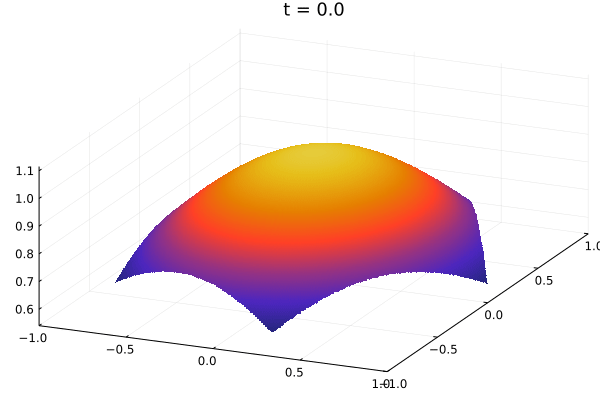

In [7]:
anim_sol(sol_n; fps=10, fn="wave eq on pentagon neumann.gif")

In [11]:
#f!(du, v, u, p, t) = @. du = v

function g_dirichlet!(dv, v, u, p, t)
    @unpack h⁻², E = p
    @inbounds for k in eachindex(dv)
        dv[k] = h⁻² * (sum(u[l] - u[k] for l in E[k]) - (4 - length(E[k])) * u[k])
    end
end

x = y = range(-1, 1; length=401)
p = My.Param(isin_unit_pentagon, x, y)
tspan = (0.0, 20.0)

f(x, y) = exp(-(x^2 + y^2)/(2*0.2^2))
U0 = f.(x, y')
V0 = zero(U0)

u0 = My.mat2vec(p, U0)
v0 = My.mat2vec(p, V0)

#@time prob = DynamicalODEProblem(g_dirichlet!, f!, v0, u0, tspan, p)
@time prob = SecondOrderODEProblem(g_dirichlet!, v0, u0, tspan, p)
@time sol_d = solve(prob; saveat=0.1);

  0.028854 seconds (42.58 k allocations: 3.206 MiB, 88.57% compilation time)
104.555928 seconds (9.47 M allocations: 834.167 MiB, 0.12% gc time)


Progress: 100%|█████████████████████████████████████████| Time: 0:03:40
┌ Info: Saved animation to 
│   fn = D:\OneDrive\public\0003\wave eq on pentagon dirichlet CMRmap.gif
└ @ Plots D:\.julia\packages\Plots\XuV6v\src\animation.jl:104


Plots.AnimatedGif("D:\\OneDrive\\public\\0003\\wave eq on pentagon dirichlet CMRmap.gif")
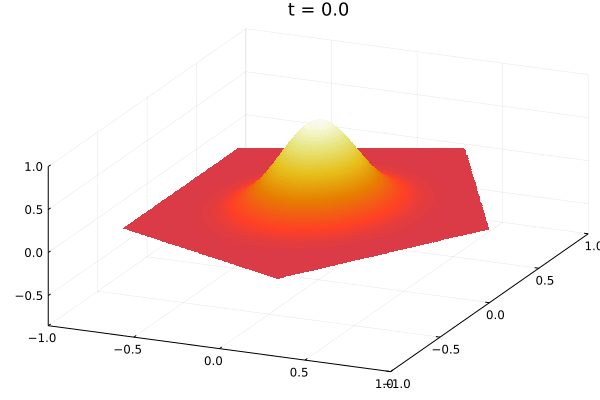

In [12]:
anim_sol(sol_d; fps=10, fn="wave eq on pentagon dirichlet CMRmap.gif")

Progress: 100%|█████████████████████████████████████████| Time: 0:03:38
┌ Info: Saved animation to 
│   fn = D:\OneDrive\public\0003\wave eq on pentagon dirichlet gist_earch.gif
└ @ Plots D:\.julia\packages\Plots\XuV6v\src\animation.jl:104


Plots.AnimatedGif("D:\\OneDrive\\public\\0003\\wave eq on pentagon dirichlet gist_earch.gif")
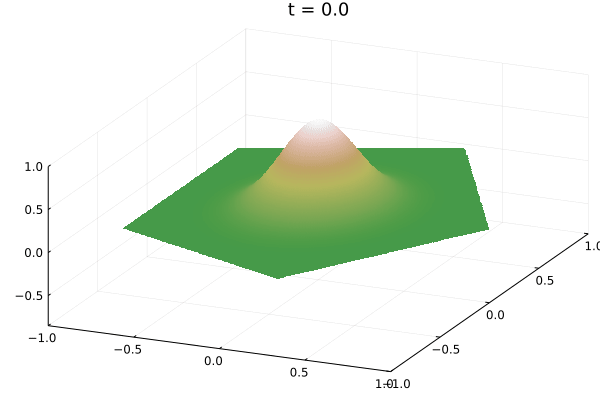

In [13]:
anim_sol(sol_d; fps=10, fn="wave eq on pentagon dirichlet gist_earch.gif", color=:gist_earth)